In [1]:
import os
import warnings
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

In [2]:
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models
from tensorflow.keras.models import load_model
from tensorflow.keras import models
from PIL import Image 
from skimage.io import imread
import cv2

K.clear_session()

2024-02-20 09:12:29.784434: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-20 09:12:29.784537: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-20 09:12:30.078725: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# <b>IMAGE PROCESSSING</b>

<h2>Reshaping dimensions so we can start processing arrays. </h2>

In [3]:
img = plt.imread("/kaggle/input/foodies-ai-food-image-classification-challenge/Foodies_Challenge/Chole_bature/00000004_resized.png")
dims = np.shape(img)
matrix = np.reshape(img, (dims[0] * dims[1], dims[2]))
print(np.shape(matrix))

(90000, 3)


Image shape ->  (300, 300)
Color channels ->  3
Min color depth : 0.0, Max color depth 1.0


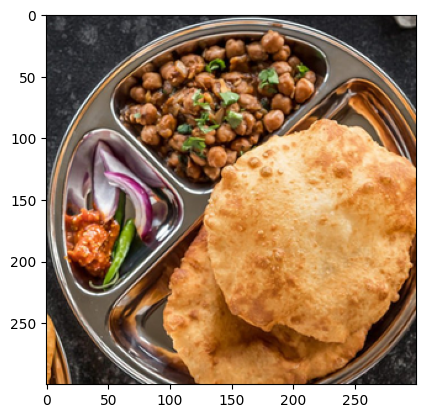

In [4]:
plt.imshow(img)
print("Image shape -> ",dims[:2])
print("Color channels -> ",dims[2])
print("Min color depth : {}, Max color depth {}".format(np.min(img),np.max(img)))

<h2>Plot for visualizing pixel intensities for RGB in color space</h2>

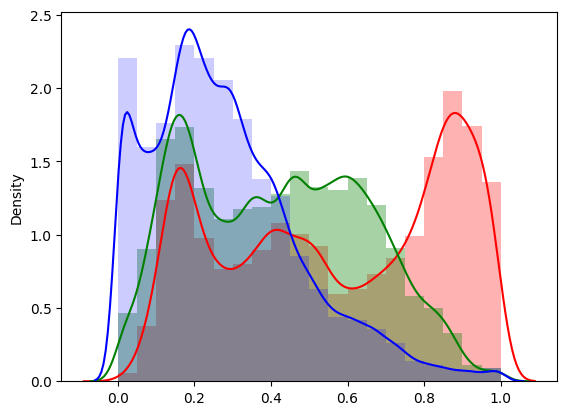

In [5]:
sns.distplot(matrix[:,0], bins=20,color="red",hist_kws=dict(alpha=0.3))
sns.distplot(matrix[:,1], bins=20,color="green",hist_kws=dict(alpha=0.35))
sns.distplot(matrix[:,2], bins=20,color="blue",hist_kws=dict(alpha=0.2))
plt.show()

<h2>Plot for visualizing histogram between 2 color channel</h2>

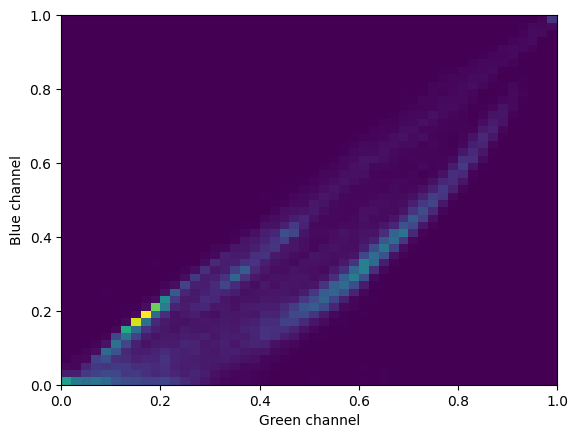

In [6]:
_ = plt.hist2d(matrix[:,1], matrix[:,2], bins=(50,50))
plt.xlabel('Green channel')
plt.ylabel('Blue channel')
plt.show()

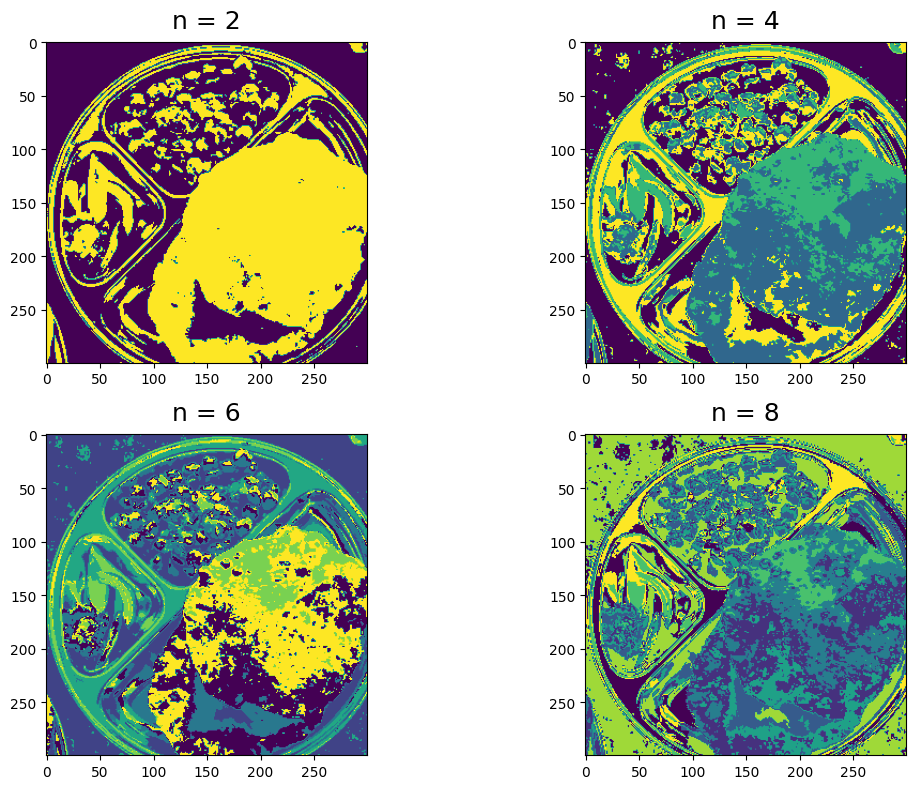

In [7]:
from sklearn import cluster
n_vals=[2,4,6,8]
plt.figure(1, figsize=(12, 8))

for subplot,n in enumerate(n_vals):
    kmeans=cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    dims = np.shape(img)
    clustered_img = np.reshape(clustered, (dims[0], dims[1]))
    plt.subplot(2,2, subplot+1)
    plt.title("n = {}".format(n), pad = 10,size=18)
    plt.imshow(clustered_img)
    
plt.tight_layout()

<h2> Visualize the channel intensity for every cluster we just generated.</h2>

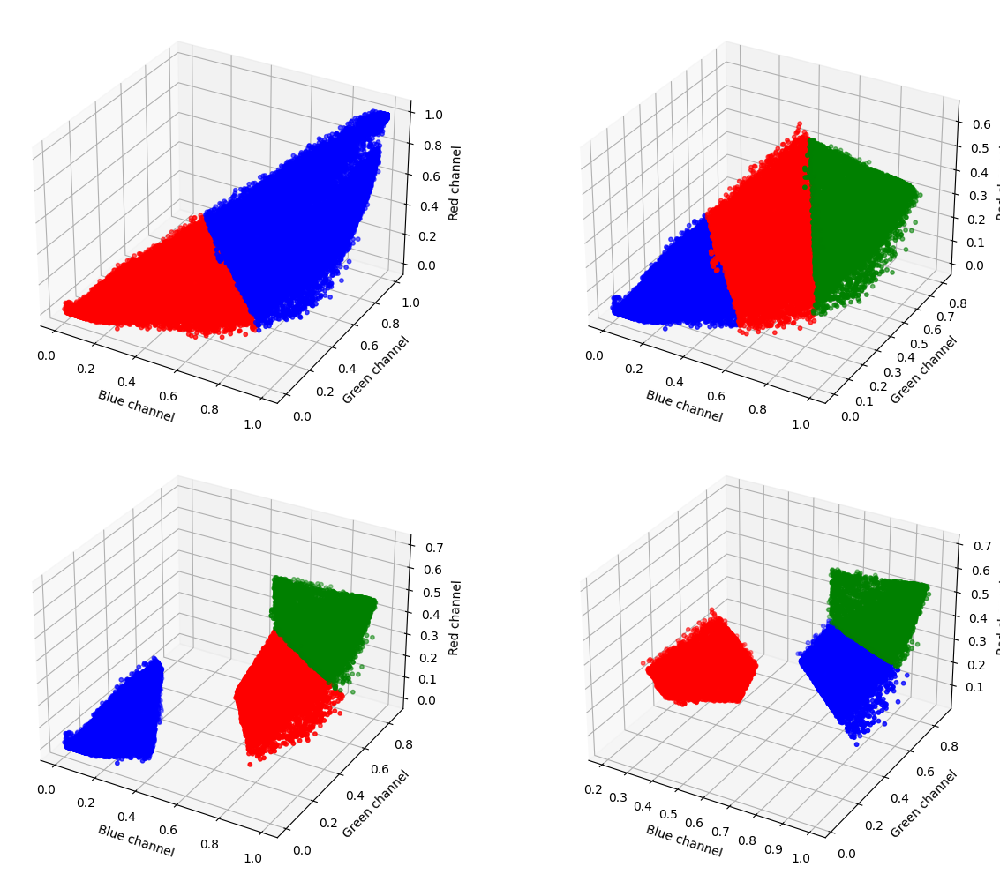

In [8]:
from mpl_toolkits.mplot3d import Axes3D

fig=plt.figure(figsize=(14,10))

ax = [fig.add_subplot(221, projection='3d'),
      fig.add_subplot(222, projection='3d'),
      fig.add_subplot(223, projection='3d'),
      fig.add_subplot(224, projection='3d')]

for plot_number,n in enumerate(n_vals):
    
    kmeans=cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    x1, y1, z1 = [np.where(clustered == x)[0] for x in [0, 1, 2]]

    plot_vals = [('r', x1),
                 ('b', y1),
                 ('g', z1),
                 ]
    
    for c, channel in plot_vals:
        x = matrix[channel, 0]
        y = matrix[channel, 1]
        z = matrix[channel, 2]
        ax[plot_number].scatter(x, y, z, c=c,s=10)
    
    ax[plot_number].set_xlabel('Blue channel')
    ax[plot_number].set_ylabel('Green channel')
    ax[plot_number].set_zlabel('Red channel')

plt.tight_layout()

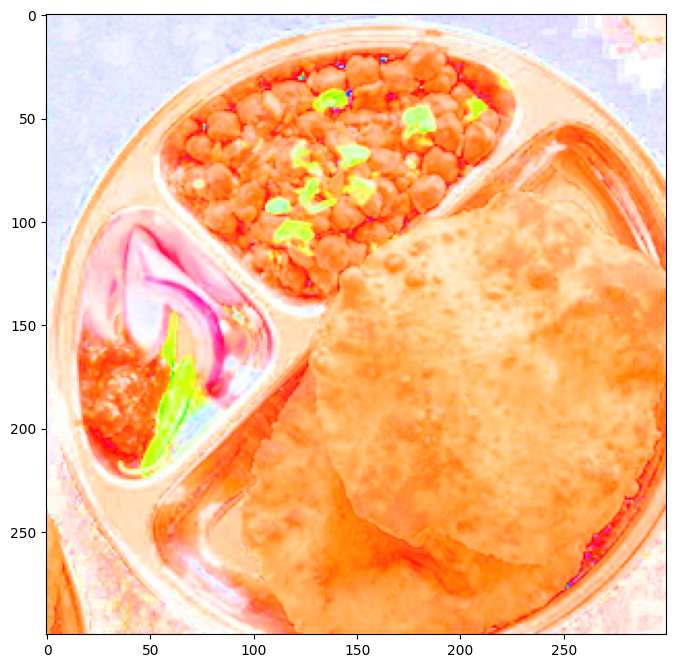

In [9]:
bnorm = np.zeros_like(matrix, dtype=np.float32)
max_range = np.max(matrix, axis=1)
bnorm = matrix / np.vstack((max_range, max_range, max_range)).T
bnorm_img = np.reshape(bnorm, (dims[0],dims[1],dims[2]))
plt.figure(figsize=(8,10))
plt.imshow(bnorm_img)
plt.show()

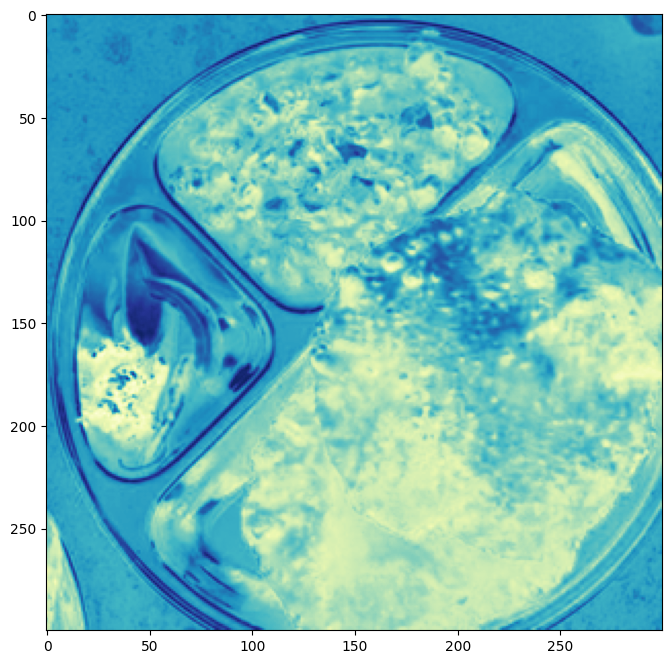

In [10]:
from sklearn.decomposition import PCA

pca = PCA(3)
pca.fit(matrix)
img_pca = pca.transform(matrix)
img_pca = np.reshape(img_pca, (dims[0], dims[1], dims[2]))
cmap="YlGnBu"
fig = plt.figure(figsize=(8, 8))
plt.imshow(img_pca[:,:,1], cmap=cmap)

# <b>Exploratory Data Analysis (EDA)</b>

## Let's visualize number of training examples for each food item

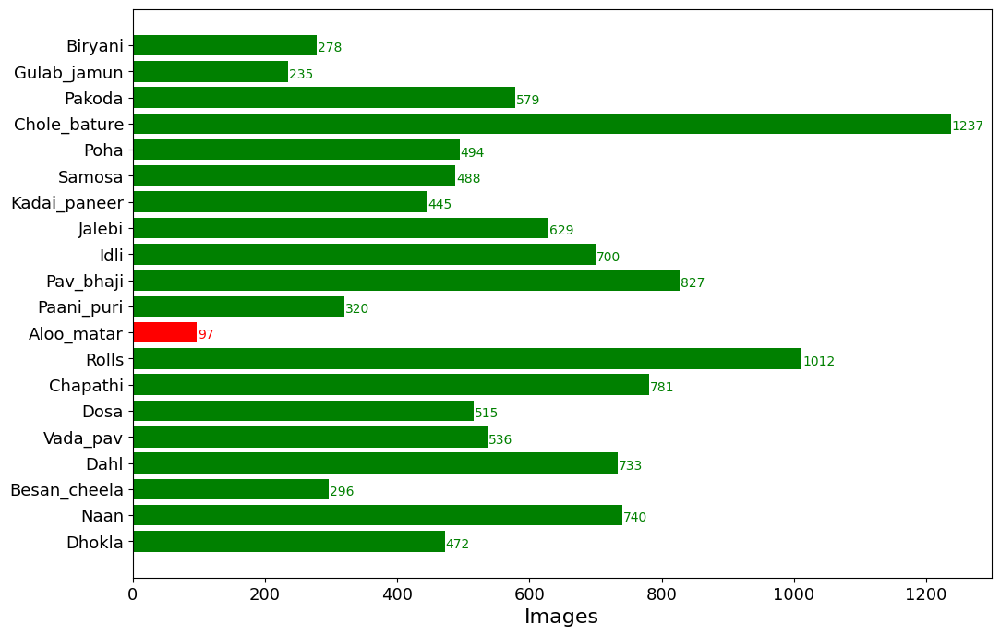

In [11]:
main='/kaggle/input/foodies-ai-food-image-classification-challenge/Foodies_Challenge'

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    count=len(os.listdir(sub_dir))
    data[i]=count
    
  
keys = data.keys()
values = data.values()

colors=["red" if x<= 150 else "green" for x in values]

fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

## Let's visualize our dataset by randomly picking an image from every class

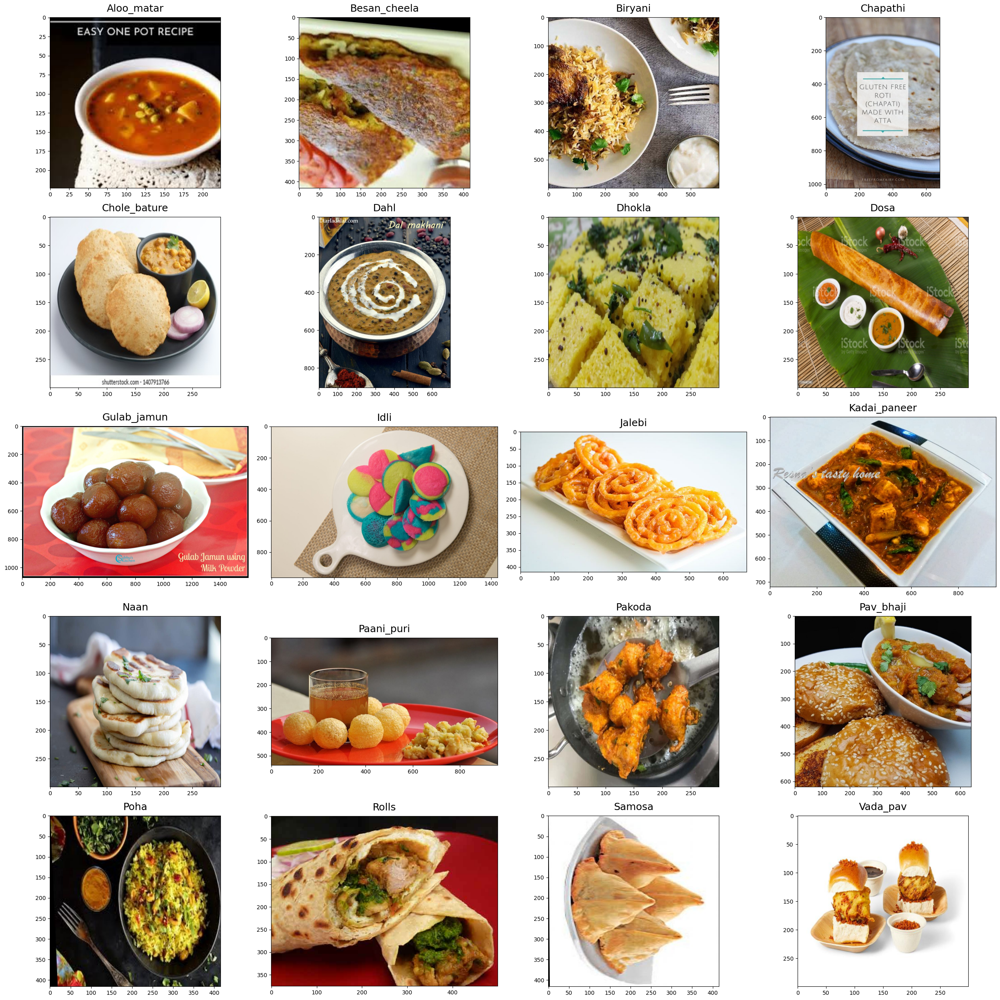

In [12]:
import random

train_folder = "/kaggle/input/foodies-ai-food-image-classification-challenge/Foodies_Challenge"
images = []

for food_folder in sorted(os.listdir(train_folder)):
    food_items = os.listdir(train_folder + '/' + food_folder)
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(train_folder,food_folder,food_selected))
                                     
fig=plt.figure(1, figsize=(25, 25))

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(5, 4, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)
    
plt.tight_layout()

<hr>

# <b> Pre Processing </b>

In [13]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Set the path to the dataset folder
dataset_folder = '/kaggle/input/foodies-ai-food-image-classification-challenge/Foodies_Challenge'

# Function to create subfolders for each food type
def create_subfolders(base_folder, image_paths):
    for image_path in image_paths:
        food_type = os.path.basename(os.path.dirname(image_path))
        target_folder = os.path.join(base_folder, food_type)
        os.makedirs(target_folder, exist_ok=True)
        shutil.copy(image_path, target_folder)

# Get the list of image files
image_files = []
for root, dirs, files in os.walk(dataset_folder):
    for file in files:
        if file.endswith(".png") or file.endswith(".jpg"):
            image_files.append(os.path.join(root, file))

# Split the dataset into training, validation, and test sets
train_files, test_files = train_test_split(image_files, test_size=0.2, random_state=42)
train_files, val_files = train_test_split(train_files, test_size=0.2, random_state=42)

# Create folders for training, validation, and test sets
train_folder = '/kaggle/working/train'
val_folder = '/kaggle/working/valid'
test_folder = '/kaggle/working/test'

os.makedirs(train_folder, exist_ok=True)
os.makedirs(val_folder, exist_ok=True)
os.makedirs(test_folder, exist_ok=True)

# Organize images into respective folders
create_subfolders(train_folder, train_files)
create_subfolders(val_folder, val_files)
create_subfolders(test_folder, test_files)

print("Images organized into train, valid, and test folders.")


Images organized into train, valid, and test folders.


In [24]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

n_classes = 20
batch_size = 32
img_width, img_height = 299, 299

train_data_dir = '/kaggle/working/train'

# Data Augmentation with ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

val_data_dir = '/kaggle/working/valid'

val_datagen = ImageDataGenerator(rescale=1. / 255)

val_generator = val_datagen.flow_from_directory(
    val_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 7267 images belonging to 20 classes.
Found 1817 images belonging to 20 classes.


## Training the model

In [25]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
# from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
# from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten

from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Dense, Dropout

from tensorflow.keras import regularizers
from tensorflow.keras.regularizers import l2

from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger

nb_train_samples = 3583 
nb_validation_samples = 1089

inception = InceptionV3(weights='imagenet', include_top=False)
x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(units=20,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=inception.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='v1_inceptionV3', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_v1_inceptionV3.log')

history = model.fit_generator(train_generator,
                    steps_per_epoch = nb_train_samples // batch_size,
                    validation_data=val_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    epochs=20,
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])

Epoch 1/20


I0000 00:00:1708421377.259791     110 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


111/111 [==============================] - ETA: 0s - loss: 1.2803 - accuracy: 0.6776
Epoch 1: val_loss improved from inf to 2.24965, saving model to v1_inceptionV3
111/111 [==============================] - 164s 1s/step - loss: 1.2803 - accuracy: 0.6776 - val_loss: 2.2497 - val_accuracy: 0.5257
Epoch 2/20
111/111 [==============================] - ETA: 0s - loss: 0.7029 - accuracy: 0.8429
Epoch 2: val_loss improved from 2.24965 to 1.69446, saving model to v1_inceptionV3
111/111 [==============================] - 133s 1s/step - loss: 0.7029 - accuracy: 0.8429 - val_loss: 1.6945 - val_accuracy: 0.5680
Epoch 3/20
111/111 [==============================] - ETA: 0s - loss: 0.5454 - accuracy: 0.8812
Epoch 3: val_loss improved from 1.69446 to 1.32525, saving model to v1_inceptionV3
111/111 [==============================] - 130s 1s/step - loss: 0.5454 - accuracy: 0.8812 - val_loss: 1.3253 - val_accuracy: 0.6498
Epoch 4/20
111/111 [==============================] - ETA: 0s - loss: 0.4600 - acc

## Saving the model

In [26]:
model.save('CodeOne.h5')

## Accuracy and Loss curves

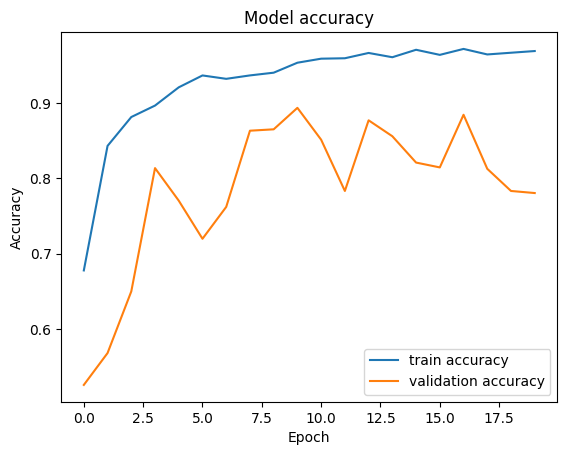

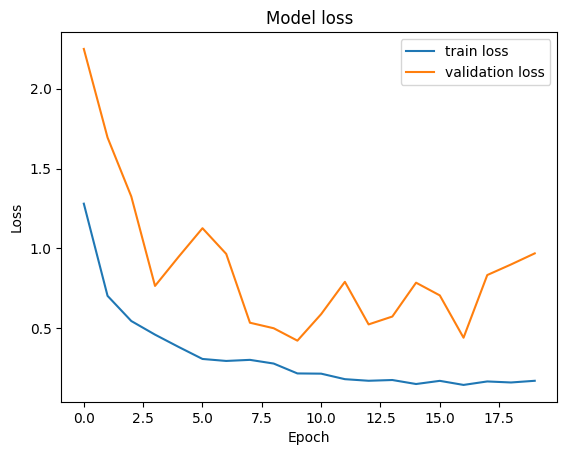

In [27]:
def plot_accuracy(history):
    
    plt.plot(history.history['accuracy'],label='train accuracy')
    plt.plot(history.history['val_accuracy'],label='validation accuracy')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Accuracy_v1_InceptionV3')
    plt.show()
    
def plot_loss(history):
    
    plt.plot(history.history['loss'],label="train loss")
    plt.plot(history.history['val_loss'],label="validation loss")
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Loss_v1_InceptionV3')
    plt.show()
    
plot_accuracy(history)
plot_loss(history)

# <b> PREDICTIONS </b>

## Load the model

In [28]:
K.clear_session()
path_to_model='CodeOne.h5'
print("Loading the model..")
model = load_model(path_to_model)
print("Done!")

Loading the model..
Done!


## Testing model on test set 

In [29]:
test_data_dir = '/kaggle/working/test'

test_datagen = ImageDataGenerator(rescale=1. / 255)

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 2272 images belonging to 20 classes.


In [31]:
scores = model.evaluate_generator(test_generator)

print("Test Accuracy: {:.3f}".format(scores[1]))

Test Accuracy: 0.783


## Function to predict single image or predict all images from a directory

In [38]:
category = {
    0: ['Aloo_matar', 'Aloo Matar'],
    1: ['Besan_cheela', 'Besan Cheela'],
    2: ['Biryani', 'Biryani'],
    3: ['Chapathi', 'Chapathi'],
    4: ['Chole_bature', 'Chole Bhature'],
    5: ['Dahl', 'Dahl'],
    6: ['Dhokla', 'Dhokla'],
    7: ['Dosa', 'Dosa'],
    8: ['Gulab_jamun', 'Gulab Jamun'],
    9: ['Idli', 'Idli'],
    10: ['Jalebi', 'Jalebi'],
    11: ['Kadai_paneer', 'Kadai Paneer'],
    12: ['Naan', 'Naan'],
    13: ['Paani_puri', 'Paani Puri'],
    14: ['Pakoda', 'Pakoda'],
    15: ['Pav_bhaji', 'Pav Bhaji'],
    16: ['Poha', 'Poha'],
    17: ['Rolls', 'Rolls'],
    18: ['Samosa', 'Samosa'],
    19: ['Vada_pav', 'Vada Pav']
}

def predict_image(filename,model):
    img_ = image.load_img(filename, target_size=(299, 299))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0) 
    img_processed /= 255.   
    
    prediction = model.predict(img_processed)
    
    index = np.argmax(prediction)
    
    plt.title("Prediction - {}".format(category[index][1]))
    plt.imshow(img_array)
    
def predict_dir(filedir,model):
    cols=5
    pos=0
    images=[]
    total_images=len(os.listdir(filedir))
    rows=total_images//cols + 1
    
    true=filedir.split('/')[-1]
    
    fig=plt.figure(1, figsize=(25, 25))
    
    for i in sorted(os.listdir(filedir)):
        images.append(os.path.join(filedir,i))
        
    for subplot,imggg in enumerate(images):
        img_ = image.load_img(imggg, target_size=(299, 299))
        img_array = image.img_to_array(img_)
        
        img_processed = np.expand_dims(img_array, axis=0) 

        img_processed /= 255.
        prediction = model.predict(img_processed)
        index = np.argmax(prediction)
        
        pred=category.get(index)[0]
        if pred==true:
            pos+=1
        
        fig=plt.subplot(rows, cols, subplot+1)
        fig.set_title(category.get(index)[1], pad = 10,size=18)
        plt.imshow(img_array)

    acc=pos/total_images
    print("Accuracy of Test : {:.2f} ({pos}/{total})".format(acc,pos=pos,total=total_images))
    plt.tight_layout()

- <h3> Single image prediction </h3>

1/1 [==============================] - 0s 28ms/step


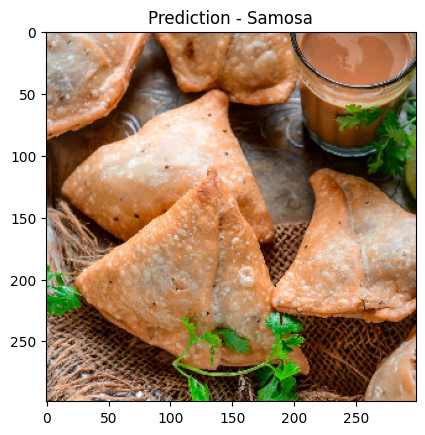

In [39]:
predict_image('/kaggle/working/test/Samosa/050(1).jpg',model)

- <h3> Predicting category </h3>

1/1 [==============================] - 0s 38ms/step
Accuracy of Test : 0.95 (91/96)


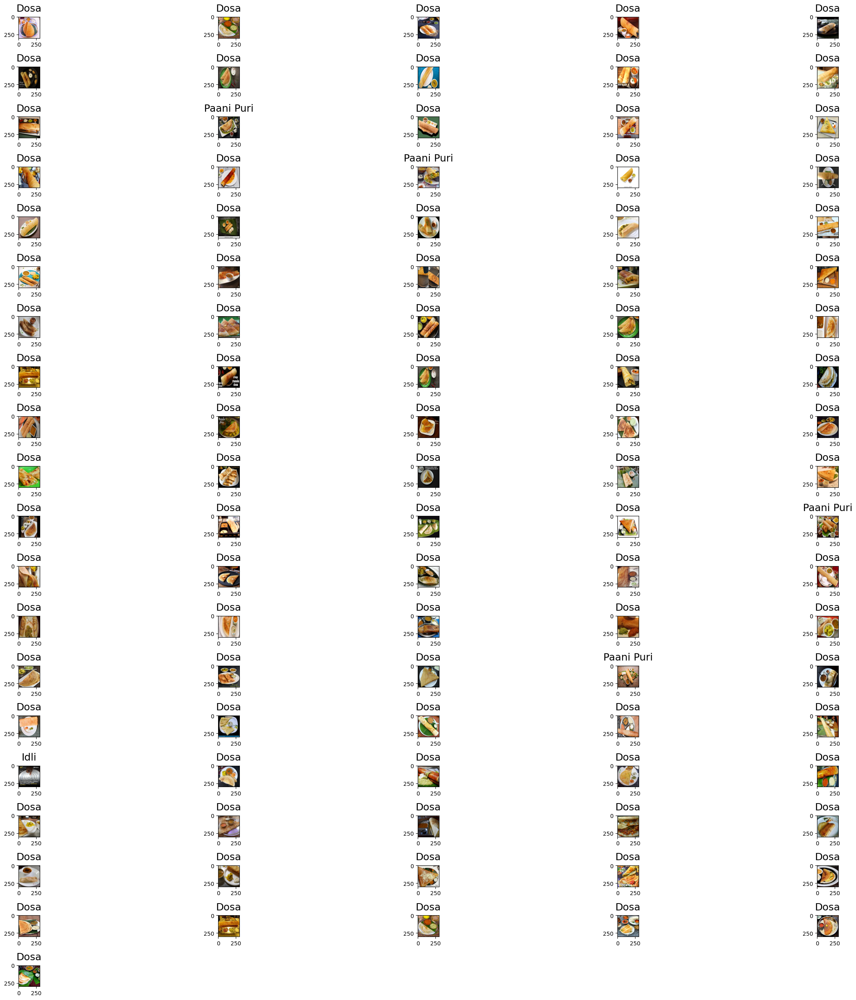

In [41]:
predict_dir("/kaggle/working/test/Dosa",model)